In [1]:
import os
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"]="1"

import os
import torch
from torch.utils.data import DataLoader
from tqdm import tqdm
import numpy as np
import torchvision
from torchvision.utils import make_grid
import time

from csgm import ConditionalScoreModel2D, ConditionalScoreModel2Dy
from csgm.utils import CustomLRScheduler

from utils_ours import uncond_loss_fn, our_loss_fn
from samplers import *

from torchvision.datasets import MNIST
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt
import functools
import math

In [2]:
T = 1

size = 256

dataset_str = "LIDC" #@param ['LIDC', 'MNIST'] {'type':'string'}


eps = 5e-3
device = "cuda"

inv_prob = "ct"#@param ['ct', 'deblurr'] {'type':'string'}


batch_size = 100
num_samples = 1000#@param {"type":"integer"}

saved_samples = 50

## Parameters below are fixed for our experiment. Changing them will require training a new model for our approach.


sig_blurr = 5

max_angle = 45
color_channels = 1

#angles = int(size * max_angle / 180.)
angles = size

num_steps = 1000

if dataset_str == "MNIST": 
    ## learning rate
    lr= 0.002 #@param {'type':'number'}
    lr_final = 0.0005
    modes = 15
    hidden_dim = 32
    from torchvision.datasets import MNIST

    dataset = MNIST('.', 
                train=False, 
                transform=torchvision.transforms.Compose(
                    [#torchvision.transforms.Resize(32),
                     torchvision.transforms.ToTensor(), 
                     torchvision.transforms.Lambda(lambda x: x.permute(1, 2, 0))]),
                download=True)
    val_data_loader = DataLoader(dataset, batch_size=1, shuffle=True, num_workers=4)
    sig_obs = 0.05
elif dataset_str == "LIDC":
    lr= 0.002 #@param {'type':'number'}
    lr_final = 0.0005
    modes = 50
    hidden_dim = 128
    from utils_ours import LungDataset

    dataset = LungDataset(train = False,
                       transform=torchvision.transforms.Compose(
                           [torchvision.transforms.Resize(size, antialias=True), torchvision.transforms.Lambda(lambda x: x.permute(1, 2, 0))]))

    val_data_loader = DataLoader(dataset, batch_size=1, shuffle=True, num_workers=4)
    sig_obs = 0.05
    

In [3]:
# @title Load the score-based model


if True:
    #prepare forward map and other required parameters
    if inv_prob == "deblurr":
        from utils_ours import build_blurring_operator
        A = build_blurring_operator(size, sig_blurr).to(device)
    elif inv_prob == "ct":
        from utils_ours import build_CT_operator
        try:
            A = torch.load("CT_forward" + str(size) + "angles" + str(angles) + "max_angle" + str(max_angle) +".pt")
        except:
            print("Building Forward map")
            A = build_CT_operator(size, angles, max_angle) 
        A = torch.from_numpy(A).to(device).float()


/tmp/ipykernel_4460/562218819.py:12: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  A = torch.load("CT_forward" + str(size) + "angles" + str(angles) + "max_angle" + str(max_a

## Generate Measurement

/fabian/work/Project CT Diffusion/SBD-task--/SBD-task-dependent-main/utils_ours.py:202: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  image = torch.load(img_name)
/fabian/wo

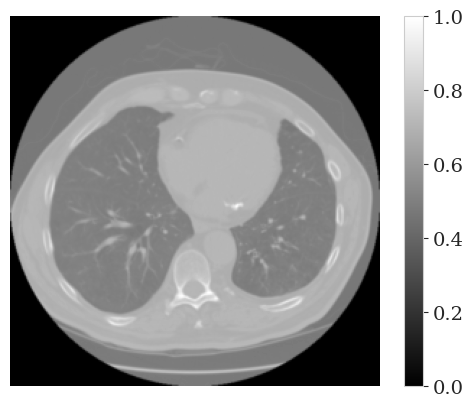

In [4]:
%matplotlib inline
torch.manual_seed(13)

if dataset_str == 'MNIST':
    true, _ = next(iter(val_data_loader))
else:
    true = next(iter(val_data_loader))


plt.imshow(true[0, :, :, 0], cmap = 'gray')
plt.colorbar()
plt.grid(None) 
plt.axis('off')
#plt.savefig("truth.jpg")
plt.show()

true = true.cuda()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


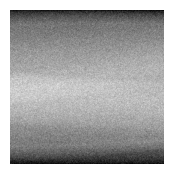

In [5]:
y = A.float() @ true.reshape(size**2, -1).to(A.device).float()
if inv_prob == "ct":
    y = y.reshape((1, size, angles))
elif inv_prob == "deblurr":
    y = y.reshape((1, size, size))
    
y = y + sig_obs * torch.randn_like(y)
y = y.cuda().float()

sample_grid = make_grid(y / torch.max(y), nrow=1)

plt.figure(figsize=(2,2))
plt.axis('off')
plt.imshow(sample_grid.permute(1, 2, 0).cpu())
plt.show()

## Generate Posterior samples

In [6]:
filename = "unconditional" + "_" + "T=" + str(T)+ "_" + dataset_str + str(size)+ str(hidden_dim)

uncond_score_model = ConditionalScoreModel2D(
        modes=modes,
        hidden_dim=hidden_dim,
        nlayers=4,
        nt=T
    ).to(device)

cond_score_model = ConditionalScoreModel2Dy(
        modes=modes,
        hidden_dim=hidden_dim,
        nlayers=4,
        nt=T
    ).to(device)

our_score_model = ConditionalScoreModel2D(
        modes=modes,
        hidden_dim=hidden_dim,
        nlayers=4,
        nt=T#,
        #norm_layersize = size
    ).to(device)


ckpt = torch.load(os.path.join("cpts","ckpt_trained_" + filename + ".pth"), map_location=device)
uncond_score_model.load_state_dict(ckpt)

if inv_prob == "ct":
    filename = "ours" + "_" + "T=" + str(T)+ "_" + dataset_str + inv_prob + str(max_angle) + str(size)+ str(hidden_dim)
    ckpt = torch.load(os.path.join("cpts","ckpt_trained_" + filename + ".pth"), map_location=device)
    our_score_model.load_state_dict(ckpt)

    filename = "conditional" + "_" + "T=" + str(T)+ "_" + dataset_str + inv_prob + str(max_angle)+ str(size)+ str(hidden_dim)
    ckpt = torch.load(os.path.join("cpts","ckpt_trained_" + filename + ".pth"), map_location=device)
    cond_score_model.load_state_dict(ckpt)
elif inv_prob == "deblurr":
    filename = "ours" + "_" + "T=" + str(T)+ "_" + dataset_str + inv_prob + str(sig_blurr)+ str(size)+ str(hidden_dim)
    ckpt = torch.load(os.path.join("cpts","ckpt_trained_" + filename + ".pth"), map_location=device)
    our_score_model.load_state_dict(ckpt)

    filename = "conditional" + "_" + "T=" + str(T)+ "_" + dataset_str + inv_prob + str(sig_blurr)+ str(size)+ str(hidden_dim)
    ckpt = torch.load(os.path.join("cpts","ckpt_trained_" + filename + ".pth"), map_location=device)
    cond_score_model.load_state_dict(ckpt)


cond_score_model.eval()
our_score_model.eval()
uncond_score_model.eval()

pass

/tmp/ipykernel_4460/1814890370.py:26: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(os.path.join("cpts","ckpt_trained_" + filename + ".pth"), map_location=

100%|█████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [07:46<00:00,  2.14it/s]


time elapsed: 4668.237478256226


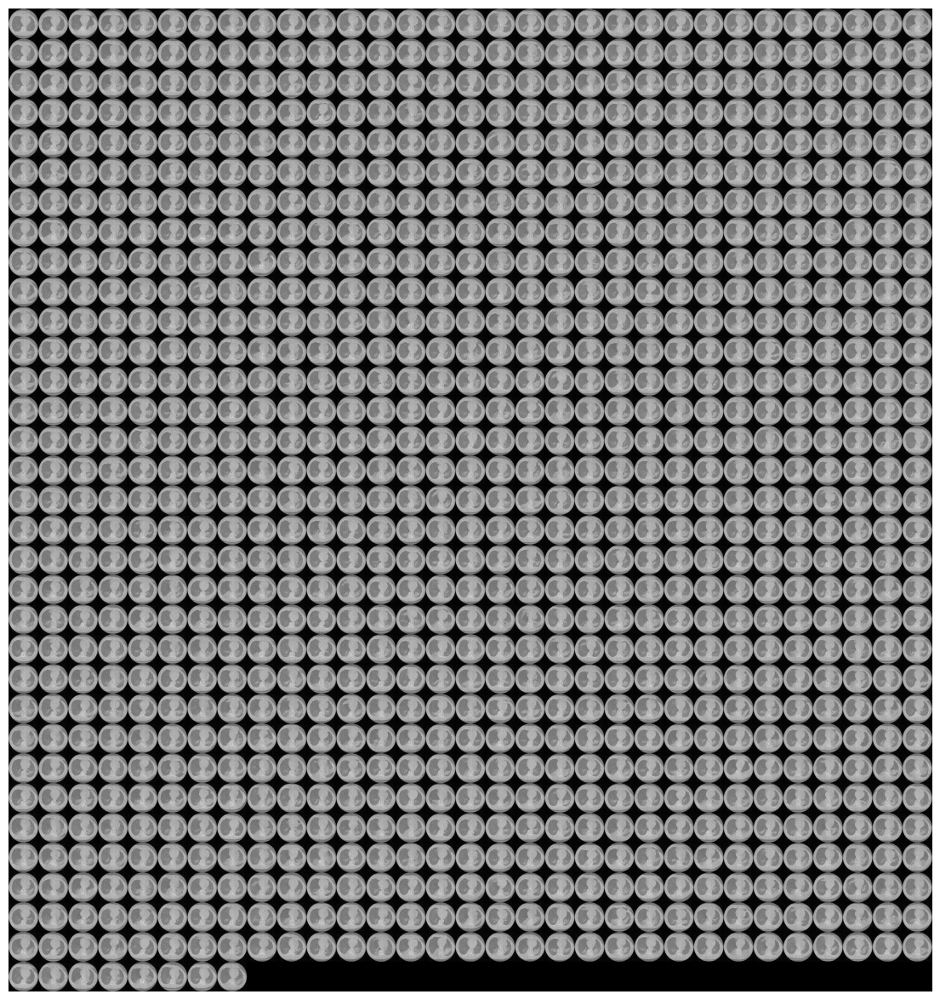

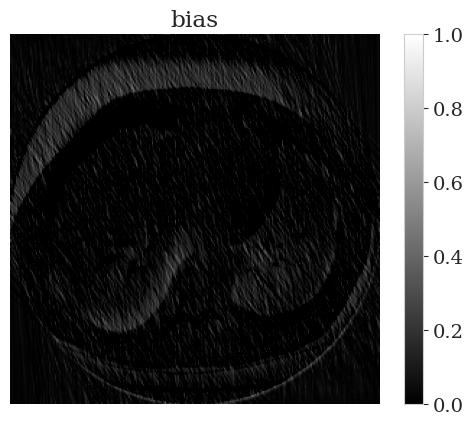

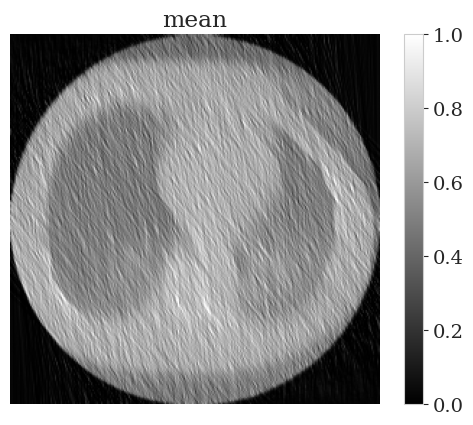

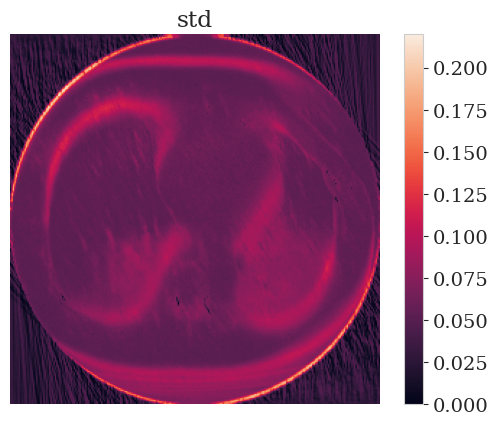

std: tensor(0.0639, device='cuda:0') bias: tensor(0.1026, device='cuda:0') l2: tensor(0.1208, device='cuda:0')


In [7]:
## Generate samples using the specified sampler.
start = time.time()
samples = ALD_sampler(uncond_score_model, 
                  T,
                  y = y.repeat((batch_size, 1, 1)).reshape((batch_size, 1, A.shape[0])),
                  A = A, 
                  sig_obs = sig_obs,
                  nsamples = num_samples,
                  batch_size = batch_size, 
                  num_steps = num_steps,
                  eps = eps,
                  size = size,
                  color_channels = 1,
                  device=device)

print("time elapsed:", time.time() - start)
## Sample visualization.
samples = samples.clamp(0.0, 1.0)
%matplotlib inline
sample_grid = make_grid(samples, nrow=int(np.sqrt(num_samples)))

plt.figure(figsize=(15,15))
plt.axis('off')
plt.imshow(sample_grid.permute(1, 2, 0).cpu(), vmin=0., vmax=1.)
plt.show()

std_ald = torch.std(samples, axis = 0)[0, :, :]
bias_ald = (torch.mean(samples, axis = 0) - true.to(samples.device)[0, :, :, 0])[0, :, :]
l2_ald = torch.mean((samples.cuda() - true[0, :, :, 0][None, None, :, :])**2)**0.5

plt.imshow(torch.mean(samples, axis = 0)[0].cpu().detach() - true.cpu().detach()[0, :, :, 0], vmin=0., vmax=1., cmap = 'gray')
plt.title("bias")
plt.colorbar()
plt.grid(None) 
plt.axis('off')
plt.show()
plt.imshow(torch.mean(samples, axis = 0)[0].cpu().detach(), vmin=0., vmax=1., cmap = 'gray')
plt.title("mean")
plt.colorbar()
plt.grid(None) 
plt.axis('off')
plt.show()
plt.imshow(torch.std(samples, axis = 0)[0].cpu().detach())
plt.title("std")
plt.colorbar()
plt.grid(None) 
plt.axis('off')
plt.show()

samples_ald = samples[0:saved_samples, :, :, :]
print("std:" , torch.mean(std_ald**2)**0.5, "bias:", torch.mean(bias_ald**2)**0.5, "l2:", l2_ald)

100%|█████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [08:47<00:00,  1.90it/s]


time elapsed: 10547.210797309875


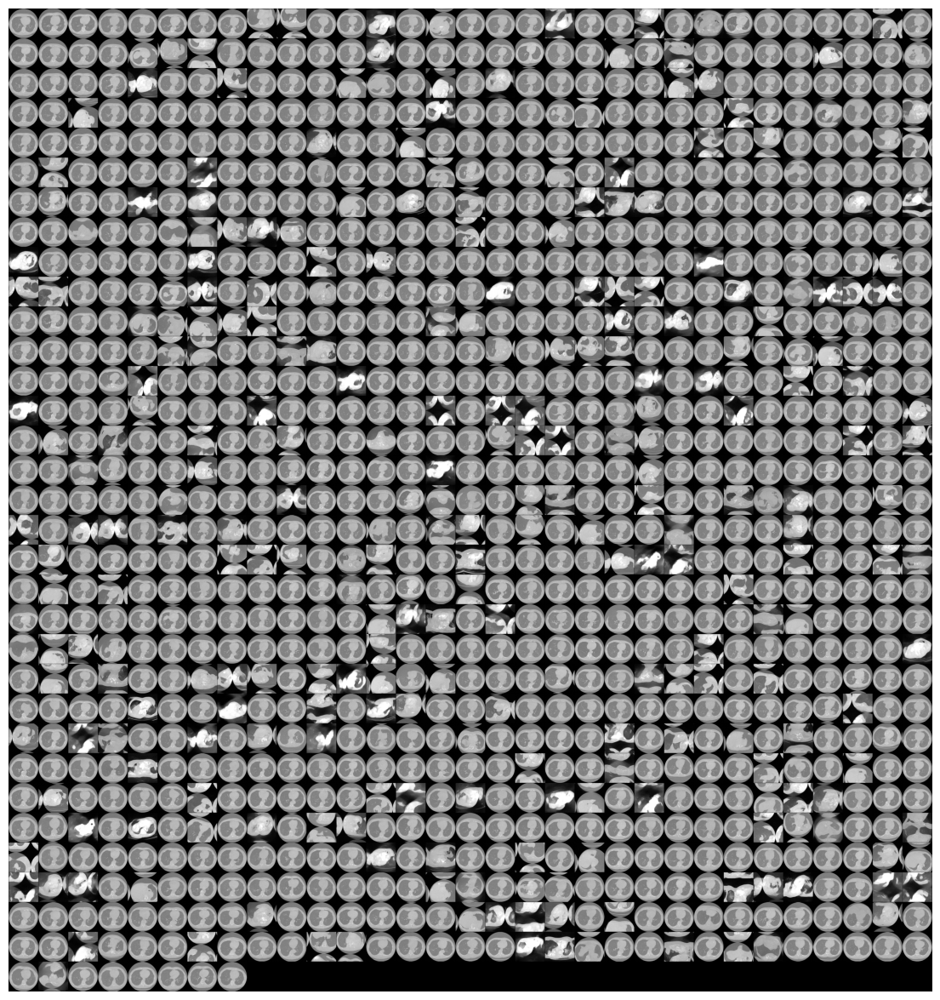

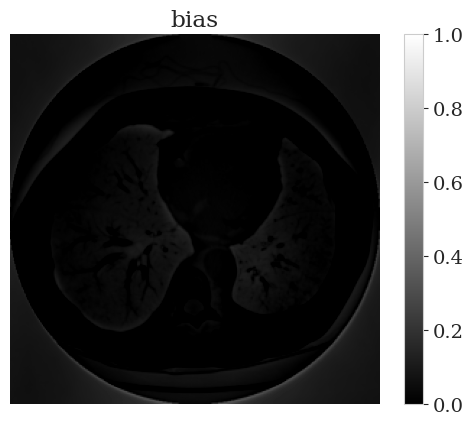

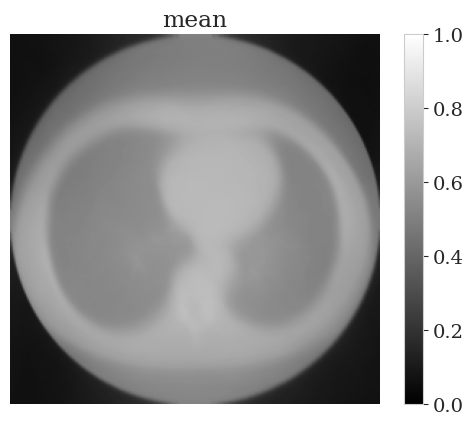

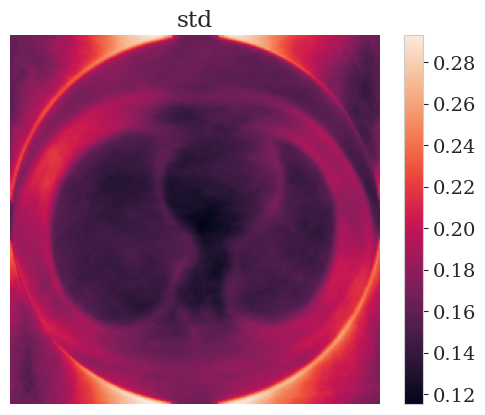

('std:',
 tensor(0.1730, device='cuda:0', grad_fn=<PowBackward0>),
 'bias:',
 tensor(0.0729, device='cuda:0', grad_fn=<PowBackward0>),
 'l2:',
 tensor(0.1876, device='cuda:0', grad_fn=<PowBackward0>))

In [8]:
#tune hyperparameter
dpmbs = 50
params = [0.1, 10, 50, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 5000]
res = torch.zeros(len(params))
for i, p in enumerate(params):
    samples = DPM_sampler(uncond_score_model, 
                  T = T,
                  y = y.repeat((dpmbs, 1, 1)).reshape((dpmbs, 1, A.shape[0])),
                  A = A, 
                  sig_obs = sig_obs,
                  nsamples = dpmbs,
                  p = p,
                  batch_size = dpmbs, 
                  num_steps = 300,
                  eps = eps,
                  size = size,
                  color_channels = 1,
                  device=device)
    std = torch.std(samples, axis = 0)[0, :, :]
    bias = (torch.mean(samples, axis = 0) - true.to(samples.device)[0, :, :, 0])[0, :, :]
    res[i] = torch.sum(std**2) + torch.sum(bias**2)


p = params[torch.argmin(res)]    
## Generate samples using the specified sampler.
start = time.time()
samples = DPM_sampler(uncond_score_model, 
                  T = T,
                  y = y.repeat((dpmbs, 1, 1)).reshape((dpmbs, 1, A.shape[0])),
                  A = A, 
                  sig_obs = sig_obs,
                  nsamples = num_samples,
                  p = p,
                  batch_size = dpmbs, 
                  num_steps = num_steps,
                  eps = eps,
                  size = size,
                  color_channels = 1,
                  device=device)

print("time elapsed:", time.time() - start)
## Sample visualization.
samples = samples.clamp(0.0, 1.0)
%matplotlib inline
sample_grid = make_grid(samples, nrow=int(np.sqrt(num_samples)))

plt.figure(figsize=(15,15))
plt.axis('off')
plt.imshow(sample_grid.permute(1, 2, 0).cpu(), vmin=0., vmax=1.)
plt.show()

std_dpm = torch.std(samples, axis = 0)[0, :, :]
bias_dpm = (torch.mean(samples, axis = 0) - true.to(samples.device)[0, :, :, 0])[0, :, :]
l2_dpm = torch.mean((samples.cuda() - true[0, :, :, 0][None, None, :, :])**2)**0.5

plt.imshow(torch.mean(samples, axis = 0)[0].cpu().detach() - true.cpu().detach()[0, :, :, 0], vmin=0., vmax=1., cmap = 'gray')
plt.title("bias")
plt.colorbar()
plt.grid(None) 
plt.axis('off')
plt.show()
plt.imshow(torch.mean(samples, axis = 0)[0].cpu().detach(), vmin=0., vmax=1., cmap = 'gray')
plt.title("mean")
plt.colorbar()
plt.grid(None) 
plt.axis('off')
plt.show()
plt.imshow(torch.std(samples, axis = 0)[0].cpu().detach())
plt.title("std")
plt.colorbar()
plt.grid(None) 
plt.axis('off')
plt.show()

samples_dpm = samples[0:saved_samples, :, :, :]
("std:" , torch.mean(std_dpm**2)**0.5, "bias:", torch.mean(bias_dpm**2)**0.5, "l2:", l2_dpm)


100%|█████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [26:38<00:00,  1.60s/it]


time elapsed: 15979.381848573685


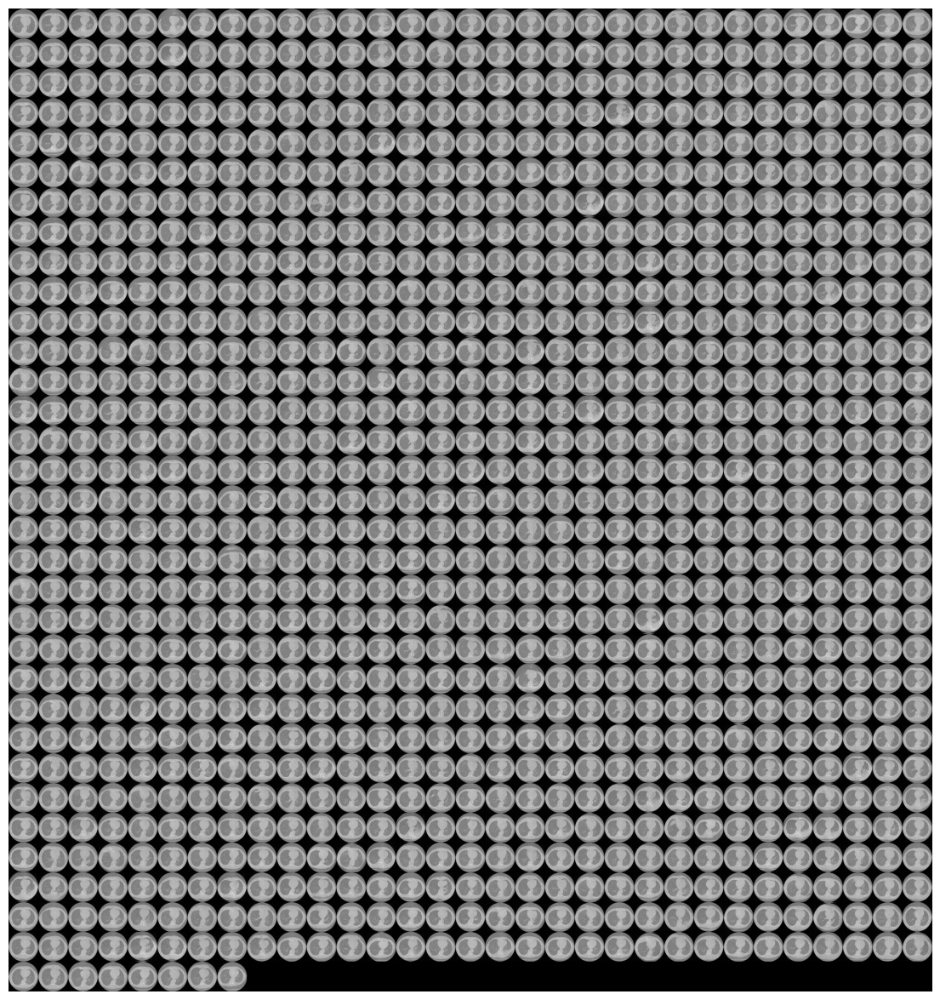

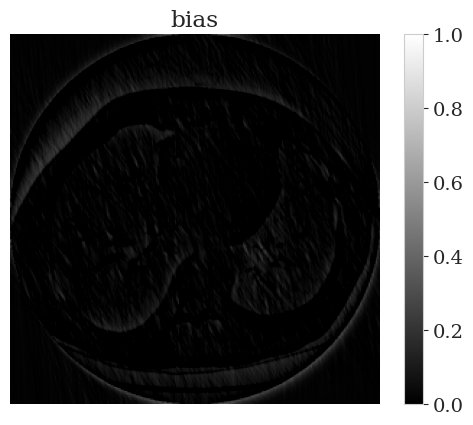

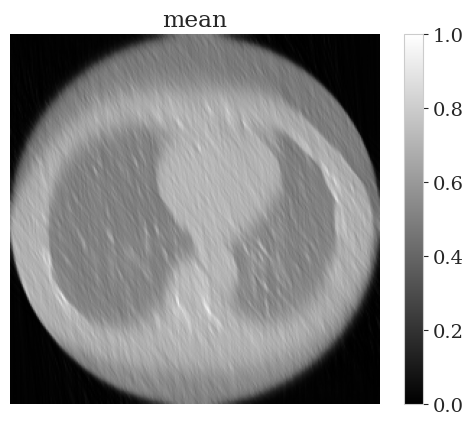

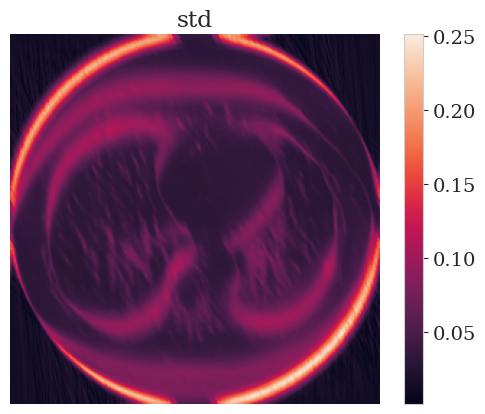

std: tensor(0.0691, device='cuda:0') bias: tensor(0.0691, device='cuda:0') l2: tensor(0.0898, device='cuda:0')


In [9]:
#tune hyperparameter
dpmbs = 100
params = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
res = torch.zeros(len(params))
for i, param in enumerate(params):
    samples = Projection_sampler(uncond_score_model, 
                  lamb = param, 
                  T = T,
                  y = y.repeat((dpmbs, 1, 1)).reshape((dpmbs, 1, A.shape[0])),
                  A = A, 
                  sig_obs = sig_obs,
                  nsamples = dpmbs,
                  batch_size = dpmbs, 
                  num_steps = 100,
                  eps = eps,
                  size = size,
                  color_channels = 1,
                  device=device)
    std = torch.std(samples, axis = 0)[0, :, :]
    bias = (torch.mean(samples, axis = 0) - true.to(samples.device)[0, :, :, 0])[0, :, :]
    res[i] = torch.sum(std**2) + torch.sum(bias**2)

param = params[torch.argmin(res)]    

## Generate samples using the specified sampler.
start = time.time()
samples = Projection_sampler(uncond_score_model, 
                  lamb = param,
                  T = T,
                  y = y.repeat((batch_size, 1, 1)).reshape((batch_size, 1, A.shape[0])),
                  A = A, 
                  sig_obs = sig_obs,
                  nsamples = num_samples,
                  batch_size = batch_size, 
                  num_steps = num_steps,
                  eps = eps,
                  size = size,
                  color_channels = 1,
                  device=device)

print("time elapsed:", time.time() - start)
## Sample visualization.
samples = samples.clamp(0.0, 1.0)
%matplotlib inline
sample_grid = make_grid(samples, nrow=int(np.sqrt(num_samples)))

plt.figure(figsize=(15,15))
plt.axis('off')
plt.imshow(sample_grid.permute(1, 2, 0).cpu(), vmin=0., vmax=1.)
plt.show()

std_proj = torch.std(samples, axis = 0)[0, :, :]
bias_proj = (torch.mean(samples, axis = 0) - true.to(samples.device)[0, :, :, 0])[0, :, :]
l2_proj = torch.mean((samples.cuda() - true[0, :, :, 0][None, None, :, :])**2)**0.5

plt.imshow(torch.mean(samples, axis = 0)[0].cpu().detach() - true.cpu().detach()[0, :, :, 0], vmin=0., vmax=1., cmap = 'gray')
plt.title("bias")
plt.colorbar()
plt.grid(None) 
plt.axis('off')
plt.show()
plt.imshow(torch.mean(samples, axis = 0)[0].cpu().detach(), vmin=0., vmax=1., cmap = 'gray')
plt.title("mean")
plt.colorbar()
plt.grid(None) 
plt.axis('off')
plt.show()
plt.imshow(torch.std(samples, axis = 0)[0].cpu().detach())
plt.title("std")
plt.colorbar()
plt.grid(None) 
plt.axis('off')
plt.show()

samples_proj= samples[0:saved_samples, :, :, :]
print("std:" , torch.mean(std_proj**2)**0.5, "bias:", torch.mean(std_proj**2)**0.5, "l2:", l2_proj)


100%|█████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [05:40<00:00,  2.93it/s]


time elapsed: 3408.5519835948944


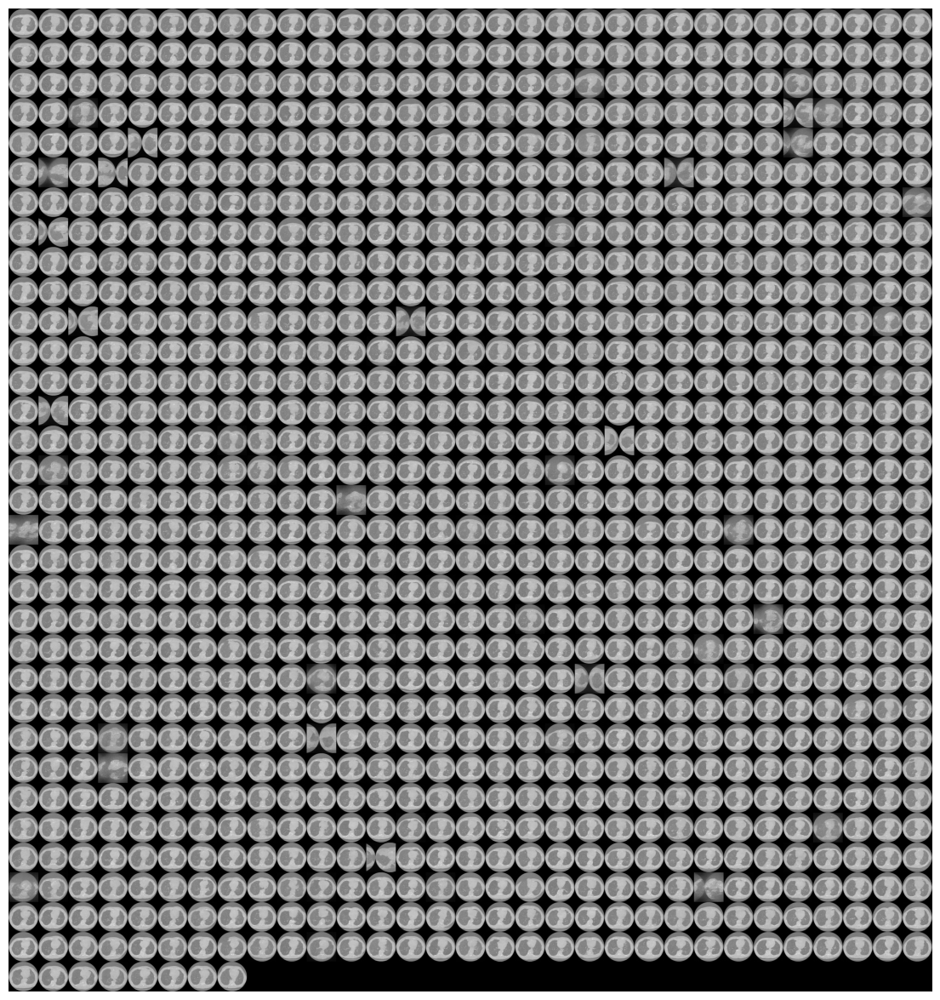

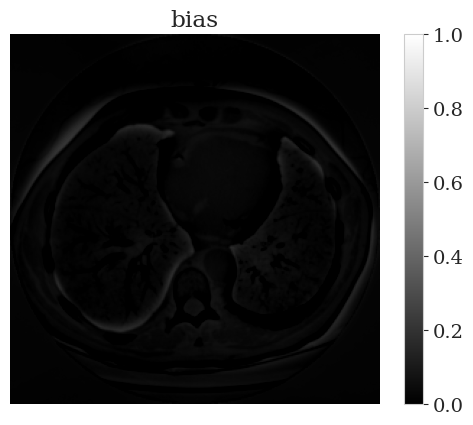

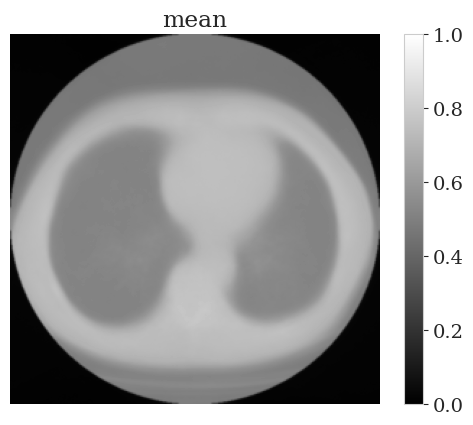

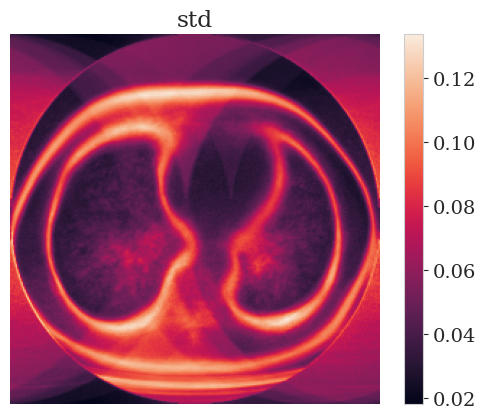

std: tensor(0.0659, device='cuda:0') bias: tensor(0.0421, device='cuda:0') l2: tensor(0.0781, device='cuda:0')


In [10]:
## Generate samples using the specified sampler.
start = time.time()
samples = cond_sampler(cond_score_model, 
                  T = T,
                  y = y.repeat((batch_size, 1, 1))[:, :, :, None],
                  A = A, 
                  sig_obs = sig_obs,
                  nsamples = num_samples,
                  batch_size = batch_size, 
                  size = size,
                  num_steps = num_steps,
                  color_channels = 1,
                  device=device,
                  eps = eps)

print("time elapsed:", time.time() - start)
## Sample visualization.
samples = samples.clamp(0.0, 1.0)
%matplotlib inline
sample_grid = make_grid(samples, nrow=int(np.sqrt(num_samples)))

plt.figure(figsize=(15,15))
plt.axis('off')
plt.imshow(sample_grid.permute(1, 2, 0).cpu(), vmin=0., vmax=1.)
plt.show()

std_cond = torch.std(samples, axis = 0)[0, :, :]
bias_cond = (torch.mean(samples, axis = 0) - true.to(samples.device)[0, :, :, 0])[0, :, :]
l2_cond = torch.mean((samples.cuda() - true[0, :, :, 0][None, None, :, :])**2)**0.5

plt.imshow(torch.mean(samples, axis = 0)[0].cpu().detach() - true.cpu().detach()[0, :, :, 0], vmin=0., vmax=1., cmap = 'gray')
plt.title("bias")
plt.colorbar()
plt.grid(None) 
plt.axis('off')
plt.show()
plt.imshow(torch.mean(samples, axis = 0)[0].cpu().detach(), vmin=0., vmax=1., cmap = 'gray')
plt.title("mean")
plt.colorbar()
plt.grid(None) 
plt.axis('off')
plt.show()
plt.imshow(torch.std(samples, axis = 0)[0].cpu().detach())
plt.title("std")
plt.colorbar()
plt.grid(None) 
plt.axis('off')
plt.show()

samples_cond = samples[0:saved_samples, :, :, :]
print("std:" , torch.mean(std_cond**2)**0.5, "bias:", torch.mean(bias_cond**2)**0.5, "l2:", l2_cond)


100%|█████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [05:40<00:00,  2.94it/s]


time elapsed: 3404.682067632675


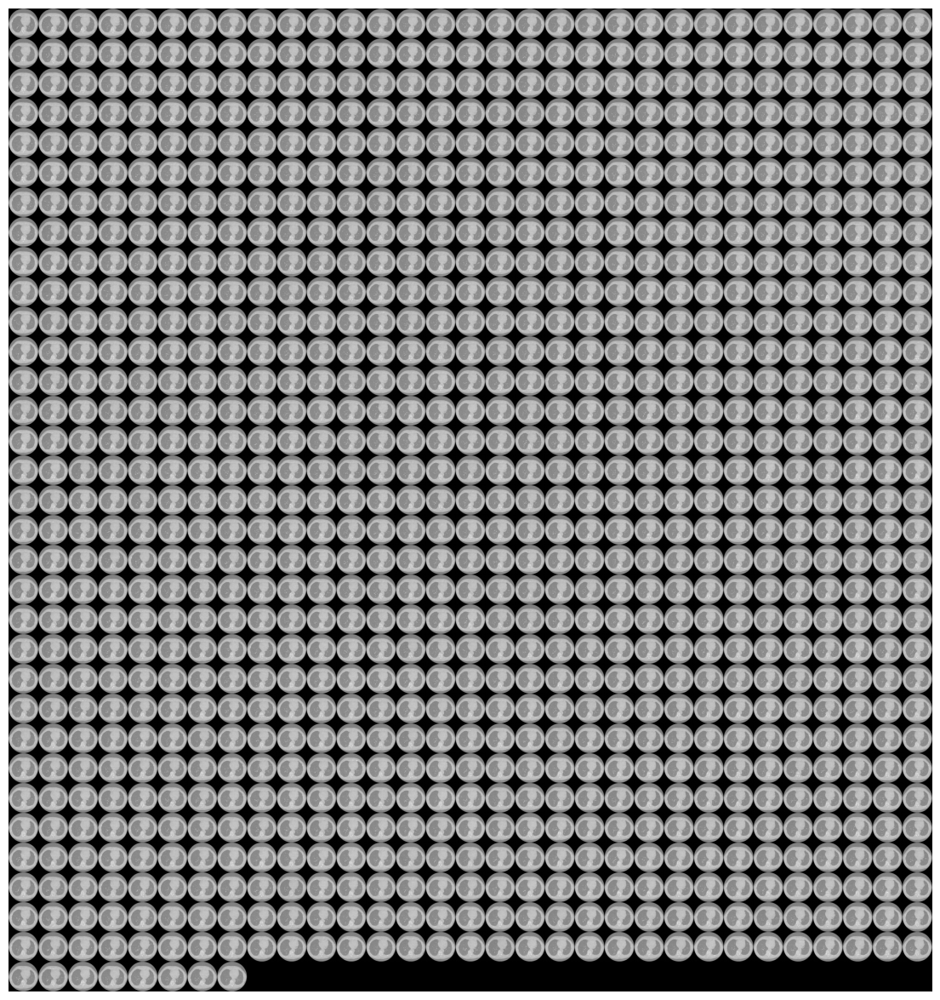

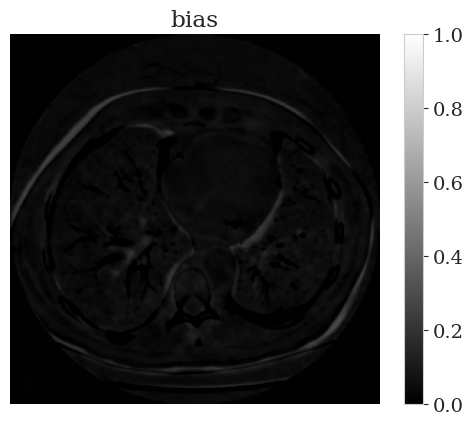

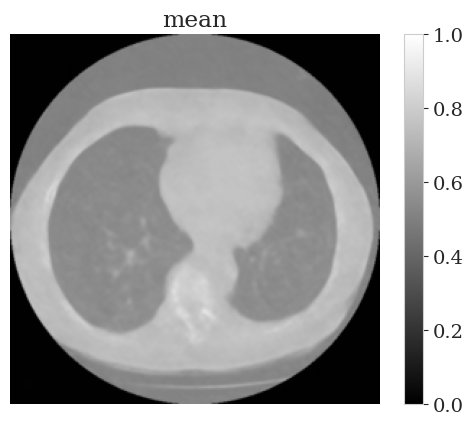

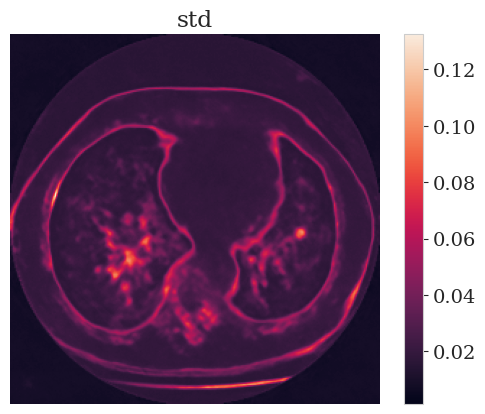

std: tensor(0.0254, device='cuda:0') bias: tensor(0.0530, device='cuda:0') l2: tensor(0.0588, device='cuda:0')


In [12]:
## Generate samples using the specified sampler.
start = time.time()
samples = Our_sampler(our_score_model, 
                  T = T,
                  y = y.repeat((batch_size, 1, 1)).reshape((batch_size, 1, A.shape[0])),
                  A = A, 
                  sig_obs = sig_obs,
                  nsamples = num_samples,
                  batch_size = batch_size, 
                  size = size,
                  num_steps = num_steps,
                  color_channels = 1,
                  device=device,
                  eps = eps)

print("time elapsed:", time.time() - start)
## Sample visualization.p
samples = samples.clamp(0.0, 1.0)
%matplotlib inline
sample_grid = make_grid(samples, nrow=int(np.sqrt(num_samples)))

plt.figure(figsize=(15,15))
plt.axis('off')
plt.imshow(sample_grid.permute(1, 2, 0).cpu(), vmin=0., vmax=1.)
plt.show()

std_ours = torch.std(samples, axis = 0)[0, :, :]
bias_ours = (torch.mean(samples, axis = 0) - true.to(samples.device)[0, :, :, 0])[0, :, :]
l2_ours = torch.mean((samples.cuda() - true[0, :, :, 0][None, None, :, :])**2)**0.5

plt.imshow(torch.mean(samples, axis = 0)[0].cpu().detach() - true.cpu().detach()[0, :, :, 0], vmin=0., vmax=1., cmap = 'gray')
plt.title("bias")
plt.colorbar()
plt.grid(None) 
plt.axis('off')
plt.show()
plt.imshow(torch.mean(samples, axis = 0)[0].cpu().detach(), vmin=0., vmax=1., cmap = 'gray')
plt.title("mean")
plt.colorbar()
plt.grid(None) 
plt.axis('off')
plt.show()
plt.imshow(torch.std(samples, axis = 0)[0].cpu().detach())
plt.title("std")
plt.colorbar()
plt.grid(None) 
plt.axis('off')
plt.show()
samples_ours = samples[0:saved_samples, :, :, :]

print("std:" , torch.mean(std_ours**2)**0.5, "bias:", torch.mean(bias_ours**2)**0.5, "l2:", l2_ours)


## Exporting images

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


var of 0.06388021286714156 for method ald
bias of 0.10256401848235566 for method ald
l2 of tensor(0.1208, device='cuda:0') for method ald
var of 0.17298148816456144 for method dpm
bias of 0.07287891899571275 for method dpm
l2 of tensor(0.1876, device='cuda:0', grad_fn=<PowBackward0>) for method dpm
var of 0.06908876392191195 for method proj
bias of 0.057448173602279815 for method proj
l2 of tensor(0.0898, device='cuda:0') for method proj
var of 0.06587209164715792 for method cond
bias of 0.04207254361813041 for method cond
l2 of tensor(0.0781, device='cuda:0') for method cond
var of 0.025411837684921116 for method ours
bias of 0.053049224919446504 for method ours
l2 of tensor(0.0588, device='cuda:0') for method ours


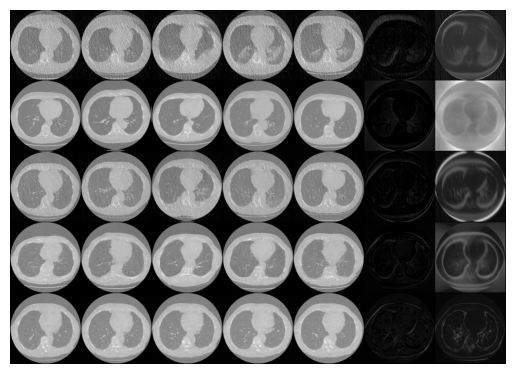

In [13]:
num_images = 5
methods = ["ald", "dpm", "proj", "cond", "ours"]

samples = torch.zeros((num_images + 2) * len(methods), 1, size, size) 
biases = [bias_ald, bias_dpm, bias_proj, bias_cond, bias_ours]
stds = [std_ald, std_dpm, std_proj, std_cond, std_ours]
l2s = [l2_ald, l2_dpm, l2_proj, l2_cond, l2_ours]

max_std = np.max([torch.max(std).item() for std in stds])
for method_number, samples_curr in enumerate([samples_ald, samples_dpm, samples_proj, samples_cond, samples_ours]):
    #std
    std = stds[method_number]
    samples[num_images + 1 + method_number * (num_images + 2)] = std / max_std
    print("var of "+ str(torch.mean(std**2).item()**0.5) + " for method " + methods[method_number])
    #bias
    bias = biases[method_number]
    samples[num_images + method_number * (num_images + 2)] = bias
    print("bias of "+ str(torch.mean(bias**2).item()**0.5) + " for method " + methods[method_number])

    print("l2 of "+ str(l2s[method_number]) + " for method " + methods[method_number])
    #samples
    for ind in range(num_images):
        samples[ind + method_number * (num_images + 2), :, :] = samples_curr[ind, :, :, :]

sample_grid = make_grid(samples, nrow = (num_images + 2))
plt.grid(None) 
plt.axis('off')
plt.imshow(sample_grid.permute(1, 2, 0).cpu(), vmin=0., vmax=1.)
plt.savefig("images/CT/summary" + str(hidden_dim) + str(num_images)+ ".png", bbox_inches='tight', dpi=1000)

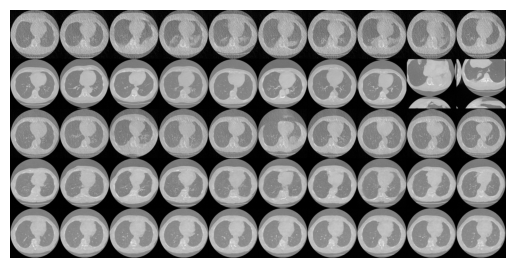

In [14]:
num_images = 10
methods = ["ald", "dpm", "proj", "cond", "ours"]

samples = torch.zeros((num_images ) * len(methods), 1, size, size) 

for method_number, samples_curr in enumerate([samples_ald, samples_dpm, samples_proj, samples_cond, samples_ours]):
    #samples
    for ind in range(num_images):
        samples[ind + method_number * (num_images), :, :] = samples_curr[ind, :, :, :]

sample_grid = make_grid(samples, nrow = (num_images))

plt.grid(None) 
plt.axis('off')
plt.imshow(sample_grid.permute(1, 2, 0).cpu(), vmin=0., vmax=1.)
plt.savefig("images/CT/samples" + str(hidden_dim) + str(num_images)+ ".png", bbox_inches='tight', dpi=1000)